In [1]:
import pandas as pd
import numpy as np
import csv
from datetime import datetime
import matplotlib.dates
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy.stats import mstats
import datetime
import random

In [2]:
def t_v_d(d):
    t = np.piecewise(d, [((d >= 0) & (d < 1.31)),((d >= 1.31) & (d < 2.01)),
                        ((d >= 2.01) & (d < 4.34)),((d >= 4.34) & (d < 5.06)),
                        ((d >= 5.06) & (d < 6.05)),((d >= 6.05) & (d < 6.85)),
                        ((d >= 6.85) & (d < 7.55)),((d >= 7.55) & (d < 8.55)),
                        ((d >= 8.55))], 
                     [lambda d :2856.4885496183206*d,
                      lambda d : 6665.714285714288*d-4990.085714285717,
                      lambda d : 2857.0815450643777*d+2665.266094420602,
                      lambda d : 3998.6111111111127*d-2288.97222222223,
                      lambda d : 2856.565656565656*d+3489.777777777781,
                      lambda d : 6666.250000000002*d-19558.812500000007,
                      lambda d : 2221.4285714285706*d+10888.214285714294,
                      lambda d : 2856.9999999999973*d+6089.65000000002,
                      lambda d : 19998.507462686568*d-140470.23880597018]
                      )
    return t

In [3]:
def d_v_t(t):
    d = np.piecewise(t, [((t >= 0) & (t < 3742)),((t >= 3742) & (t < 8408)),
                        ((t >= 8408) & (t < 15065)),((t >= 15065) & (t < 17944)),
                        ((t >= 17944) & (t < 20772)),((t >= 20772) & (t < 26105)),
                        ((t >= 26105) & (t < 27660)),((t >= 27660) & (t < 30517)),
                        ((t >= 30517))], 
                     [lambda t : 0.00035008017103153394*t,
                      lambda t : 0.00015002143163309037*t+0.7486198028289759,
                      lambda t : 0.00035000751089079164*t-0.9328631515697765,
                      lambda t : 0.00025008683570684254*t+0.572441820076417,
                      lambda t : 0.00035007072135785015*t-1.221669024045264,
                      lambda t : 0.0001500093755859741*t+2.9340052503281457,
                      lambda t : 0.00045016077170418017*t-4.901446945337624,
                      lambda t : 0.00035001750087504407*t-2.131484074203719,
                      lambda t : (5.0003731621762816e-05)*t+7.024036122098664]
                      )
    return d

In [4]:
def growth_process(curr_p,t):
    curr_t = t_v_d(curr_p)
    fut_t = t+curr_t
    fut_p = d_v_t(fut_t)
    return fut_p

In [5]:
# introduce cost for each harvest, to allow chagnes in the time interval variable
c = 0.005
# price according to alibaba
# https://www.made-in-china.com/products-search/hot-china-products/spirulina_powder_price.html
# spirulina $7/kg
p = 7

In [55]:
#use monte carlo method to randomly generate dataset
# density: from 0.50 to 10.00 g/L, probability distribution will favor interval between 3-6 g/L
# volume will be from 1ml to 1L, more probable between 1ml and 100ml interval
# time will be calculated from density and volume
# total cost will be recorded

# generate density, 0.5-3 g/L (20%), 3 - 6g/L (60%), 6-10 g/L(20%)
# generate volume, 1 - 100ml (60%), 100- 1000ml (20%), 1000 - 10000(20%)
# time calculated accordingly
def rand_den():
    value = random.randrange(0,10)
    if value <=2:
        return round(random.randrange(50,300)/100,2)
    elif value >2 and value <= 8:
        return round(random.randrange(300,600)/100,2)
    else:
        return round(random.randrange(600,1000)/100,2)

def rand_vol():
    value = random.randrange(0,10)
    if value <=6:
        return random.randrange(1,100)
    elif value >6 and value <= 8:
        return random.randrange(100,1000)
    else:
        return random.randrange(1000,10000)
    
# for these random generators, there are no distributions
def rand_den1():
    value = random.randrange(50,1000)
    return round(value/100,2)

def rand_vol1():
    value = random.randrange(1,10000)
    return round(value/1000,2)

# n stands for the number of points u want to generate, price in dollars per gram and cost is for each harvest in dollars.
# this will save the whole dataset into a csv file
def rand_gen(n,price,cost):
    density = []
    time = []
    volume = []
    revenue = []
    wearoff = []
    profit = []
    for i in range(n):
        if i%(int(n/10))==0:
            print("current progress:",i/n*100,"%")
        d = rand_den1()
        v = rand_vol1()
        new_den = ((10-v/1000)*d)/10
        t = round(t_v_d(d)-t_v_d(new_den))
        if t >0:
            r = d*v*365*1440/t*price
            w = cost*365*1440/t
            p = r - w
            density.append(d)
            time.append(t)
            volume.append(v)
            revenue.append(r)
            wearoff.append(w)
            profit.append(p)
        else:
            continue
    df_final = pd.DataFrame(columns=['density','time', 'volume','revenue','wearoff','profit'])
    df_final["density"] = density
    df_final["time"] = time
    df_final["volume"] = volume
    df_final["revenue"] = revenue
    df_final["wearoff"] = wearoff
    df_final["profit"] = profit
    name = "monte_carlo.csv"
    df_final.to_csv(name)     

# this function return the maximum profit made under price and cost given
def rand_gen_max(n,price,cost):
    density = []
    time = []
    volume = []
    revenue = []
    wearoff = []
    profit = []
    for i in range(n):
        #if i%(int(n/10))==0:
            #print("current progress:",i/n*100,"%")
        d = rand_den1()
        v = rand_vol1()
        new_den = ((10-v/1000)*d)/10
        t = round(t_v_d(d)-t_v_d(new_den))
        if t >0:
            r = d*v*365*1440/t*price
            w = cost*365*1440/t
            p = r - w
            density.append(d)
            time.append(t)
            volume.append(v)
            revenue.append(r)
            wearoff.append(w)
            profit.append(p)
        else:
            continue
    df_final = pd.DataFrame(columns=['density','time', 'volume','revenue','wearoff','profit'])
    df_final["density"] = density
    df_final["time"] = time
    df_final["volume"] = volume
    df_final["revenue"] = revenue
    df_final["wearoff"] = wearoff
    df_final["profit"] = profit
    maximum = df_final[df_final['profit']==df_final['profit'].max()]
    #print(maximum)
    return maximum["time"],maximum["profit"]

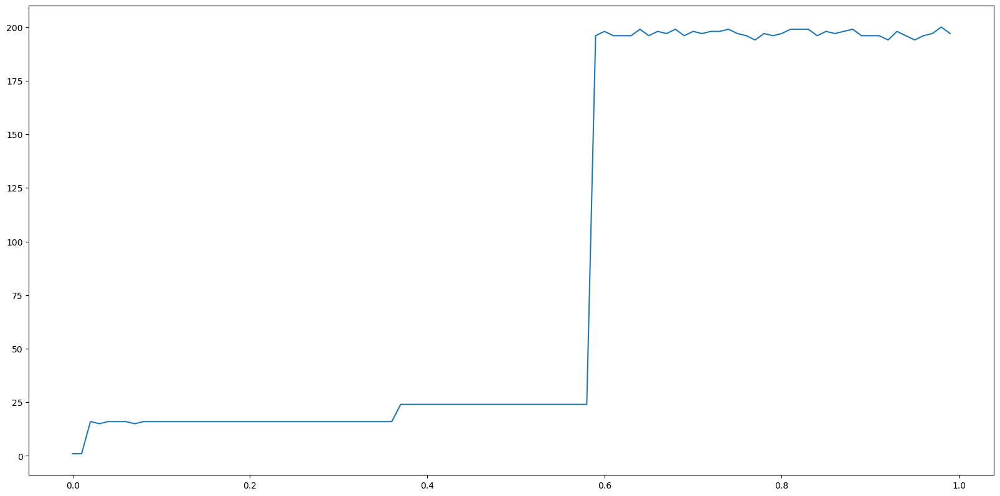

In [58]:
time = []
cost = []
profit = []
for i in range(100):
    time.append(rand_gen_max(10000,0.007,i/100)[0])
    cost.append(i/100)
    profit.append(rand_gen_max(10000,0.007,i/100)[1])

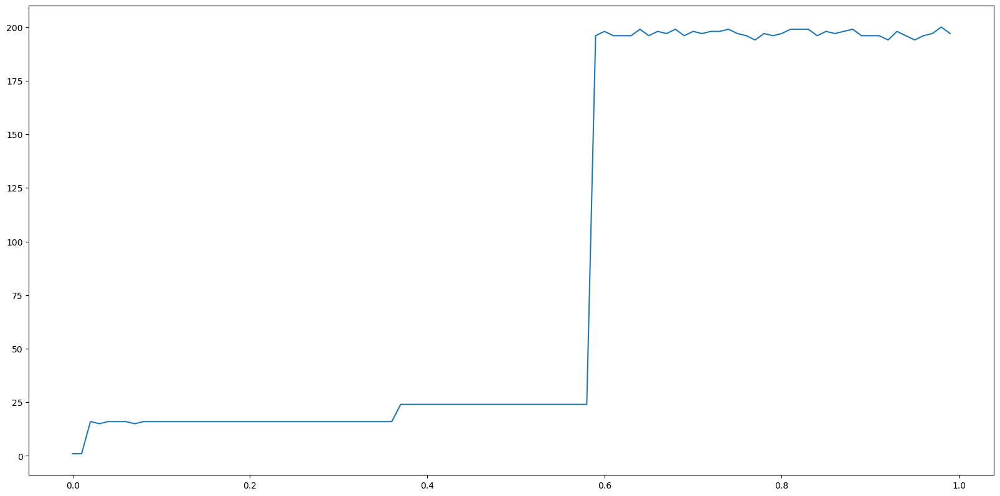

In [60]:
#this plot shows the relationship between cost and time, as cost per harvest increases, the time intervals increases as well
figure(figsize=(20, 10), dpi=100)
plt.plot(cost, time)
plt.show()

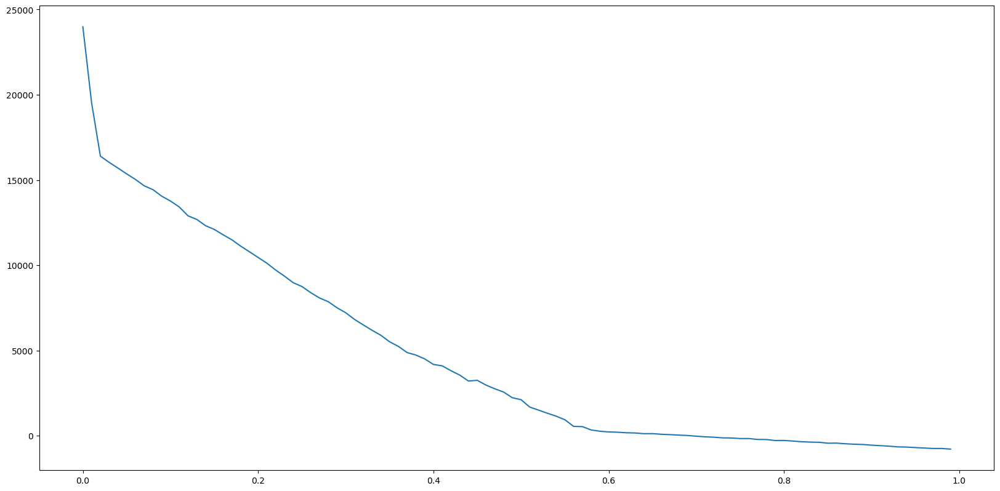

In [84]:
#this plot shows the relationship between cost and profit, as cost per harvest increases, 
# the profit decreases
figure(figsize=(20, 10), dpi=100)
p = []
for i in profit:
    p.append(i.to_numpy()[0])
plt.plot(cost, p)
plt.show()

In [7]:
rand_gen(100000,0.007,0)

current progress: 0.0 %
current progress: 10.0 %
current progress: 20.0 %
current progress: 30.0 %
current progress: 40.0 %
current progress: 50.0 %
current progress: 60.0 %
current progress: 70.0 %
current progress: 80.0 %
current progress: 90.0 %


In [8]:
df = pd.read_csv("monte_carlo.csv")
df.head(10)

,Unnamed: 0,density,time,volume,revenue,wearoff,profit
0,0,9.40,57,3.02,1832.370695,0.0,1832.370695
1,1,6.82,5,1.19,5971.930272,0.0,5971.930272
2,2,6.64,17,3.94,5661.985807,0.0,5661.985807
3,3,2.81,1,1.47,15197.671440,0.0,15197.671440
4,4,4.03,4,3.19,11824.672860,0.0,11824.672860
5,5,9.40,73,3.89,1842.926400,0.0,1842.926400
6,6,8.61,138,7.99,1834.105195,0.0,1834.105195
7,7,3.34,2,2.40,14746.233600,0.0,14746.233600
8,8,9.16,118,6.46,1845.012789,0.0,1845.012789
9,9,9.85,155,7.86,1837.724795,0.0,1837.724795


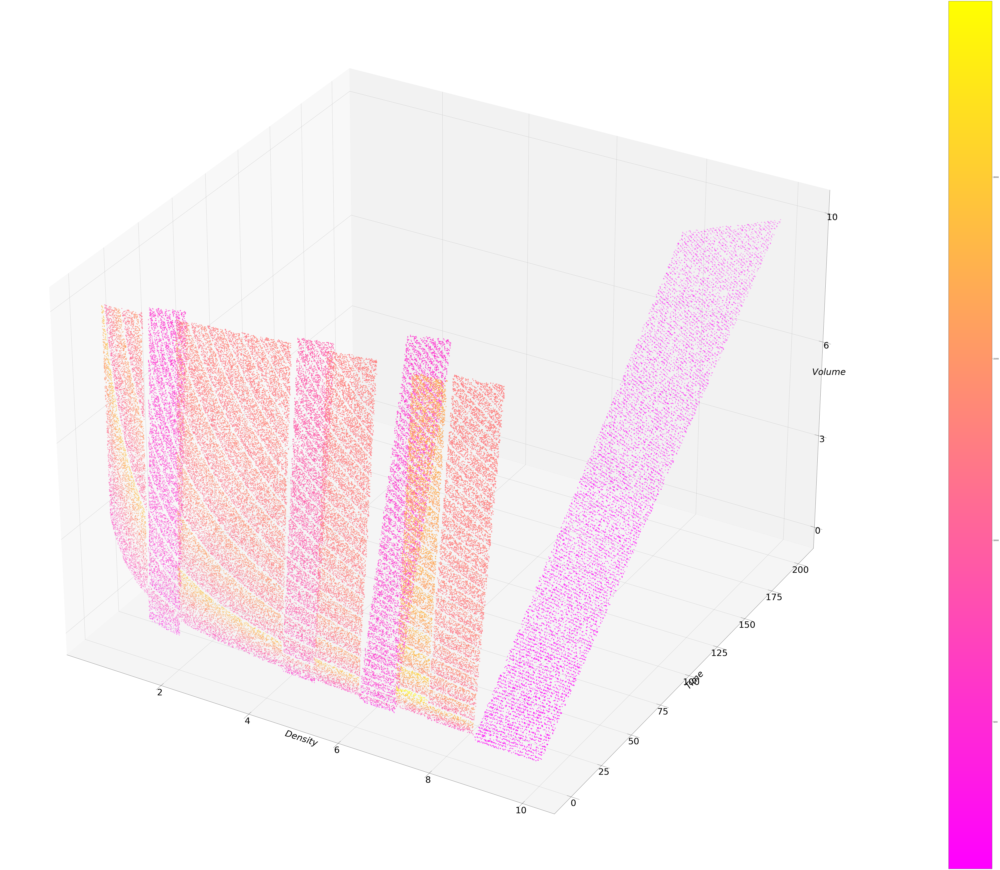

In [9]:
# Import libraries

from mpl_toolkits import mplot3d
 
# Define Dataset

x = df["density"]
y = df["time"]
z = df["volume"]
p = df["profit"]
 
# Creating figure

fig = plt.figure(figsize = (160, 90))
ax = plt.axes(projection ="3d")
  
# Creat color map

color_map = plt.get_cmap('spring')
 
# Create scatter plot and colorbar

scatter_plot = ax.scatter3D(x, y, z,
                            c=p,
                            cmap = color_map)
 
plt.colorbar(scatter_plot)

ax.set_xlabel('$Density$', fontsize=50)
ax.set_ylabel('$Time$', fontsize=50)
# set z ticks and labels
ax.set_zticks([0,3,6,10])
# change fontsize
for t in ax.xaxis.get_major_ticks(): t.label.set_fontsize(50)
for t in ax.yaxis.get_major_ticks(): t.label.set_fontsize(50)
for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(50)
# disable auto rotation
ax.zaxis.set_rotate_label(False) 
ax.set_zlabel('$Volume$', fontsize=50, rotation = 0)
plt.show()
# Show plot

plt.show()

In [10]:
df_top = df.sort_values(by='profit', ascending=False)[:1000]
df_top = df_top[["density","time","volume","profit"]]
df_top.head(10)

,density,time,volume,profit
37744,6.89,1,0.98,24842.69424
20458,7.18,1,0.94,24831.65664
44939,7.40,1,0.91,24775.73280
76888,7.08,1,0.95,24746.29920
1309,7.22,1,0.93,24704.35632
57673,7.29,1,0.92,24675.65856
53291,7.11,1,0.94,24589.56528
84897,7.18,1,0.93,24567.49008
82825,7.50,1,0.89,24558.66000
11367,7.17,1,0.93,24533.27352


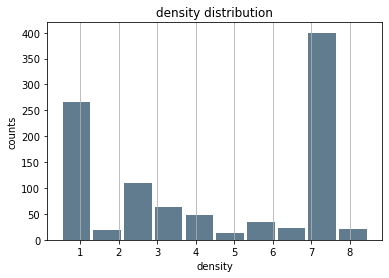

In [11]:
# Generate data on density
density = df_top["density"]
density.plot.hist(grid=True, bins=10, rwidth=0.9,
                   color='#607c8e')
plt.title('density distribution')
plt.xlabel('density')
plt.ylabel('counts')
plt.grid(axis='y', alpha=0.75)

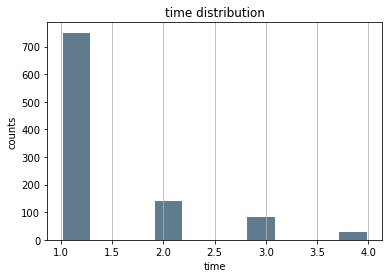

In [12]:
# Generate data on time
density = df_top["time"]
density.plot.hist(grid=True, bins=10, rwidth=0.9,
                   color='#607c8e')
plt.title('time distribution')
plt.xlabel('time')
plt.ylabel('counts')
plt.grid(axis='y', alpha=0.75)

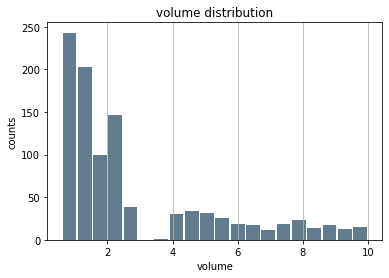

In [13]:
density = df_top["volume"]
density.plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#607c8e')
plt.title('volume distribution')
plt.xlabel('volume')
plt.ylabel('counts')
plt.grid(axis='y', alpha=0.75)

In [14]:
X = df_top.drop("profit",axis =1)
y = df_top['profit']
#use random forest to obtain feature importance

from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=5)
model = rf.fit(X,y)
model.feature_importances_
importance = pd.DataFrame(list(zip(X.columns,model.feature_importances_)),columns=
             ['predictor','feature importance'])
print(importance.sort_values(by=['feature importance'],ascending = False).head(5))

  predictor  feature importance
2    volume            0.715144
0   density            0.275796
1      time            0.009060
